### Installs, Imports and Version Info 

In [1]:
# Installs
!pip install --upgrade version_information

  Created wheel for version-information: filename=version_information-1.0.4-py3-none-any.whl size=3897 sha256=3149da79b2d21ac41caca24640891af190d9384347a0a1ada34bf100a824dbff
  Stored in directory: /root/.cache/pip/wheels/4e/53/a7/dd2201446de224470b2e086457692a1565f2d98753aae0986d
Successfully built version-information


In [2]:
# Imports
from PIL import Image
import numpy as np
import io
import pywt
import cv2 as cv
import matplotlib.pyplot as plt
import requests 

In [3]:
# Version Information
%load_ext version_information
%version_information numpy, scipy, PIL, matplotlib, version_information

Software versions
Python 3.7.12 64bit [GCC 7.5.0]
IPython 5.5.0
OS Linux 5.4.144+ x86_64 with Ubuntu 18.04 bionic
numpy 1.19.5
scipy 1.4.1
PIL 7.1.2
matplotlib 3.2.2
version_information 1.0.4
Sat Dec 25 14:01:06 2021 UTC

#Question 1: Filtering
Implement a 3 x 3, 7 x 7, 9 x 9 (i) median and (ii) average filters. Apply each one of them to this
image and comment on the results. Also, compare the results obtained by the two filtering
methods. Do not use an inbuilt filter function.

### Utils

#### Pad With Value

In [4]:
def _pad_with_value_for_conv(img, size, fill_value):
  '''
  Pad with size//2 on all sides of the input square image.
  img: 2x2 image
  size: size of one side of a square filter
  fill_value: this value will be filled while padding
  '''
  pad_offset = size//2
  return np.pad(img, pad_offset, 'constant', constant_values=fill_value), pad_offset
# FIXME: Can there be a single padding function? From scratch?

#### Pad With Edge Values

In [5]:
def _pad_with_edge_value_for_conv(img, size):
  pad_offset = size//2
  return np.pad(img, pad_offset, 'edge'), pad_offset
  
# FIXME: Can there be a single padding function? From scratch?

#### Median Filter Util

In [6]:
def apply_median_filter(img: np.ndarray, size: int):
  '''
  Apply median filter on a 2D image. padding: constant, boundary: fill with 128.
  img: 2x2 image
  size: size of one side of a square filter
  '''
  # convert to numpy array
  img = np.asarray(img)
  # pad extra bits for convolution with value 128
  PX, pad_offset = _pad_with_value_for_conv(img, size, 128)
  hh, ww = PX.shape
  # Result array 
  PX_r = np.zeros_like(PX, dtype=np.uint8)
  # Run filter center over the image part of the canvas
  for x in range(pad_offset,hh-pad_offset):
    for y in range(pad_offset,ww-pad_offset):
      filter = PX[x-pad_offset:x+pad_offset+1, y-pad_offset:y+pad_offset+1]
      PX_r[x, y] = int(np.median(filter)) # take median of the pixels covered by the filter
  return Image.fromarray(PX_r)  # Return result in image format
# FIXME: Can only one array be used?

#### Average Filter Util

In [7]:
def apply_average_filter(img: np.ndarray, size: int):
  '''
  Apply median filter on a 2D image. padding: constant, boundary: fill with 128.
  img: 2x2 image
  size: size of one side of a square filter
  '''
  # convert image to numpy array
  img = np.asarray(img)
  # define average filter of shape (size, size)
  filter = np.full((size, size), 1/size**2)
  # pad extra bits for convolution with value 128
  PX, pad_offset = _pad_with_value_for_conv(img, size, 128)
  hh, ww = PX.shape
  # Result array 
  PX_r = np.zeros_like(PX, dtype=float)
  # Run filter center over the image part of the canvas
  for x in range(pad_offset,hh-pad_offset):
    for y in range(pad_offset,ww-pad_offset):
      PX_r[x, y] = (PX[x-pad_offset:x+pad_offset+1, y-pad_offset:y+pad_offset+1]*filter).sum()
  # Normalize to range [0, 255]
  mx, mn = np.max(PX_r), np.min(PX_r)
  PX_r = (PX_r - mn)/(mx - mn) * 255
  return Image.fromarray(PX_r)
#TODO: Check if the range of values of intensities is preserved or not?

### Main

Image downloaded from url: https://www.math.ust.hk/~masyleung/Teaching/CAS/MATLAB/image/images/barbara.jpg and saved to: barbara.jpg.


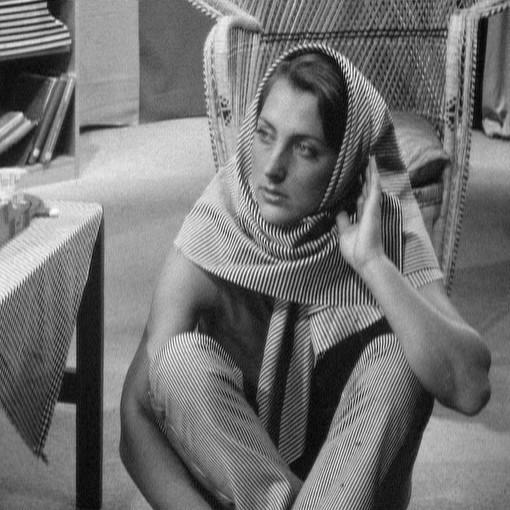

In [8]:
# Retrieve Image
# Download image securely from its URL 
def download_image(url, image_file_path):
    r = requests.get(url, timeout=4.0)
    if r.status_code != requests.codes.ok:
        assert False, 'Status code error: {}.'.format(r.status_code)

    with Image.open(io.BytesIO(r.content)) as im:
        im.save(image_file_path)

    print('Image downloaded from url: {} and saved to: {}.'.format(url, image_file_path))

download_image('https://www.math.ust.hk/~masyleung/Teaching/CAS/MATLAB/image/images/barbara.jpg', 'barbara.jpg')
barbara = Image.open('barbara.jpg') # open downloaded image
barbara #display image

*Median*

	Median Filter: 3x3				Median Filter: 7x7				Median Filter: 9x9


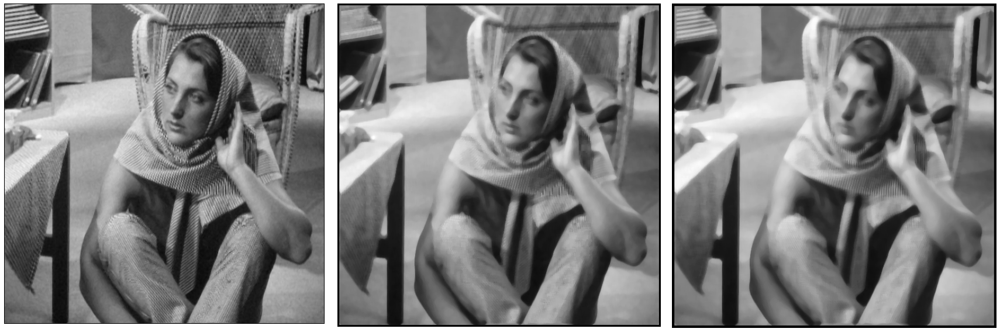

In [9]:
## Apply Median Filter
fig, (ax1, ax2, ax3) = plt.subplots(1,3, sharey=True, figsize=(24, 8))
#Apply 3x3 median filter
barbara_res = apply_median_filter(barbara, 3)
ax1.imshow(barbara_res, cmap='gray')
ax1.axis('off')
#Apply 7x7 median filter
barbara_res = apply_median_filter(barbara, 7)
ax2.imshow(barbara_res, cmap='gray')
ax2.axis('off')
#Apply 9x9 median filter
barbara_res = apply_median_filter(barbara, 9)
ax3.imshow(barbara_res, cmap='gray')
ax3.axis('off')
print('\tMedian Filter: 3x3\t\t\t\tMedian Filter: 7x7\t\t\t\tMedian Filter: 9x9')
plt.tight_layout()

*Average*

	Average Filter: 3x3				Average Filter: 7x7				Average Filter: 9x9


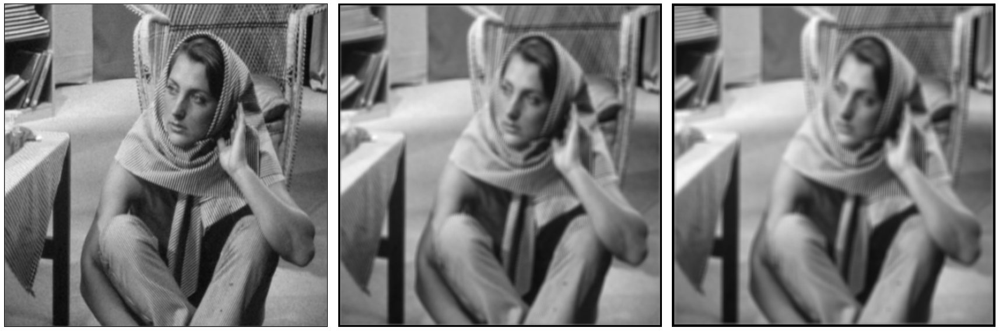

In [10]:
## Apply Average filter
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
#Apply 3x3 average filter
barbara_res = apply_average_filter(barbara, 3)
ax1.imshow(barbara_res, cmap='gray')
ax1.axis('off')
#Apply 7x7 average filter
barbara_res = apply_average_filter(barbara, 7)
ax2.imshow(barbara_res, cmap='gray')
ax2.axis('off')
#Apply 9x9 average filter
barbara_res = apply_average_filter(barbara, 9)
ax3.imshow(barbara_res, cmap='gray')
ax3.axis('off')
print('\tAverage Filter: 3x3\t\t\t\tAverage Filter: 7x7\t\t\t\tAverage Filter: 9x9')
plt.tight_layout()

# Question 2: Affine Transformation
For this image, perform the following transformations by defining the appropriate
transformation matrix.
(a) Translation by 2 pixels in any direction.
(b) Scaling by a factor of 2 in the x-direction.
(c) Rotation by 30 degrees in the anti-clockwise direction.
(d) A combination of the above three operations.

[10x3+20=50]

#### Utils

In [11]:
# Points generator
def get_grid(x, y, homogenous=True):
    xy_values = np.indices((x, y)).reshape(2, -1)
    return np.vstack((xy_values, np.ones(xy_values.shape[1], dtype=int))) if homogenous else xy_values
# Define Transformations
def get_rotate_matrix(angle):
    angle = np.radians(angle)
    return np.array([
        [np.cos(angle), -np.sin(angle), 0],
        [np.sin(angle),  np.cos(angle), 0],
        [0, 0, 1]
    ])
def get_translate_matrix(tx=0, ty=0):
    return np.array([
        [1, 0, tx],
        [0, 1, ty],
        [0, 0, 1]
    ])
def get_scale_matrix(sx=1, sy=1):
    return np.array([
        [sx, 0, 0],
        [0, sy, 0],
        [0, 0, 1]
    ])

In [12]:
def apply_transform(image, A, out_shape: tuple = None):
  '''
  Apply transformation A on image. Output shape is optional. It is a tuple specifying 
  the shape of the output image. Default is same as image shape
  '''
  image_np = np.asarray(image)
  h, w = image_np.shape[:2]
  xy_values = get_grid(w, h)
  x_img, y_img = xy_values[0], xy_values[1]
  try:
    trans_coords = np.round(A @ xy_values).astype(np.int)
  except:
    print(xy_values.shape, A.shape)
  xtrans, ytrans = trans_coords[0, :], trans_coords[1, :]
  if out_shape:
    canvas = np.zeros(out_shape, dtype=np.uint8)
    canvas[ytrans, xtrans] = image_np[y_img, x_img]
  else:
    canvas = np.zeros_like(image_np)
    interm_indices = np.where((xtrans >= 0) & (xtrans < w ) &
                   (ytrans >= 0) & (ytrans < h))
    xpix_w, ypix_w = xtrans[interm_indices], ytrans[interm_indices]
    xpix, ypix = x_img[interm_indices], y_img[interm_indices]
    # print(canvas.shape)
    canvas[ypix_w, xpix_w] = image_np[ypix, xpix]
  return Image.fromarray(canvas)


#### Main


Translation by 2 pixels in +x direction. 

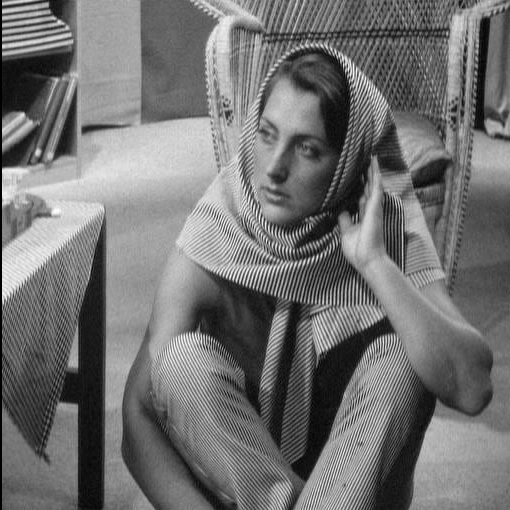

In [13]:
T = get_translate_matrix(2)
apply_transform(barbara, T)

Scaling by a factor of 2 in the x-direction.

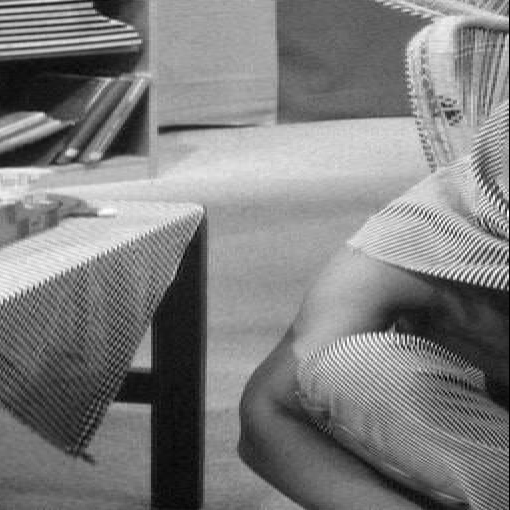

In [14]:
S = get_scale_matrix(2)
out = apply_transform(barbara, S)
# Filling in the empty columns with adjacent column
I = np.array(out)
if all(I[:, 0]) == all(np.zeros(I.shape[0])):
  s = 0
else:
  s = 1
for i in range(s, I.shape[1]-1, 2):
  I[:, i] = I[:, i+1]
Image.fromarray(I)
# apply_transform(I, np.linalg.inv(A))

Rotation by 30 degrees in anti-clockwise direction

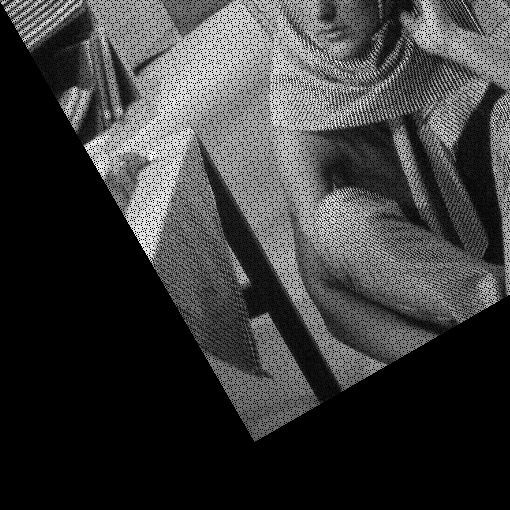

In [15]:
R = get_rotate_matrix(-30)
apply_transform(barbara, R)

Combinations of the above three operations by a single matrix

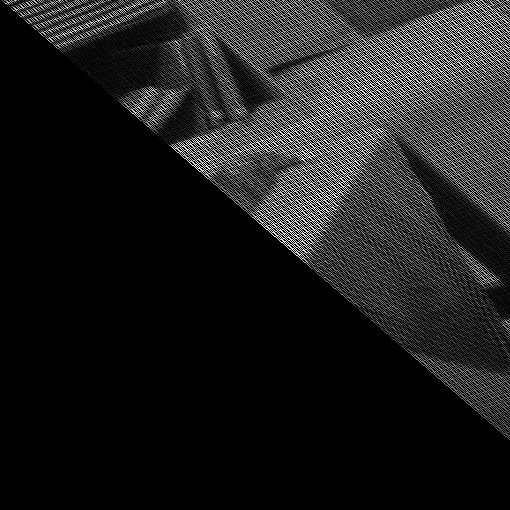

In [16]:
A = T @ S @ R
apply_transform(barbara, A)

# Question 3: Image sharpening through Laplacian
For this image, save the Laplacian image separately and add it to the input image to sharpen it.
Now, compare it with the sharpening filter - as discussed in the class. Do not use the inbuilt function for Laplacian or sharpening filter.
[30+10 =40]

### Utils

In [17]:
def apply_first_derivative_filter(img: np.ndarray):
  '''
  Apply first order derivative filter of size 3x3 on a 2D image.
  img: 2x2 image
  '''
  # convert to numpy array
  img = np.asarray(img, dtype=float)
  # define first order derivative 3x3 filter
  filter = np.array([[0, -1, 0], [0, 2, -1], [0, 0, 0]])
  # Flip the filter up-down and left-right for convolution
  filter = np.flipud(np.fliplr(filter))
  # Define canvas for processed image.
  PX = np.zeros((img.shape[0] + 2, img.shape[1] + 2, 3), dtype=float)
  # Copy padded image on each color plane of the canvas
  PX[:,:,0], _ = _pad_with_edge_value_for_conv(img[:,:,0], 3)
  PX[:,:,1], _ = _pad_with_edge_value_for_conv(img[:,:,1], 3)
  PX[:,:,2], pad_offset = _pad_with_edge_value_for_conv(img[:,:,2], 3)
  hh, ww = PX.shape[:2]
  # Result array
  PX_r = np.zeros_like(PX, dtype=float)
  pad_offset = 1
  # Apply filter on each color plane separately. The range below contains the image. Filter 
  # center passes over the range.
  for c in range(3):
    for x in range(pad_offset,hh-pad_offset):
      for y in range(pad_offset,ww-pad_offset):
        PX_r[x, y, c] = (PX[x-pad_offset:x+pad_offset+1, y-pad_offset:y+pad_offset+1, c]*filter).sum()
    # max pixel value
    mx = np.amax(PX_r[:,:,c])
    # scale but keep negative values
    PX_r[:,:, c] = PX_r[:,:, c]/mx * 255
  return PX_r
# FIXME: Is it necessary to separate color planes?

In [18]:
def apply_laplacian_filter(img: np.ndarray):
  '''
  Apply laplacian filter of size 3x3 on a 2D image. 
  img: 2x2 image
  '''
  # convert to numpy array
  img = np.asarray(img, dtype=float)
  # define laplacian 3x3 filter
  filter = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
  # Define canvas for processed image.
  PX = np.zeros((img.shape[0] + 2, img.shape[1] + 2, 3), dtype=float)
  # Copy padded image on each color plane of the canvas
  PX[:,:,0], _ = _pad_with_edge_value_for_conv(img[:,:,0], 3)
  PX[:,:,1], _ = _pad_with_edge_value_for_conv(img[:,:,1], 3)
  PX[:,:,2], pad_offset = _pad_with_edge_value_for_conv(img[:,:,2], 3)
  hh, ww = PX.shape[:2]
  # Result array
  PX_r = np.zeros_like(PX, dtype=float)
  pad_offset = 1
  for c in range(3):
    for x in range(pad_offset,hh-pad_offset):
      for y in range(pad_offset,ww-pad_offset):
        PX_r[x, y, c] = (PX[x-pad_offset:x+pad_offset+1, y-pad_offset:y+pad_offset+1, c]*filter).sum()
    # max pixel value
    mx = np.amax(PX_r[:,:,c])
    # scale but keep negative values
    PX_r[:,:, c] = PX_r[:,:, c]/mx * 255
  return PX_r
# FIXME: Is it necessary to separate color planes?

### Main

Image downloaded from url: https://english.cdn.zeenews.com/sites/default/files/2019/09/06/816813-chandrayaan-2.jpg and saved to: chandrayaan.jpg.


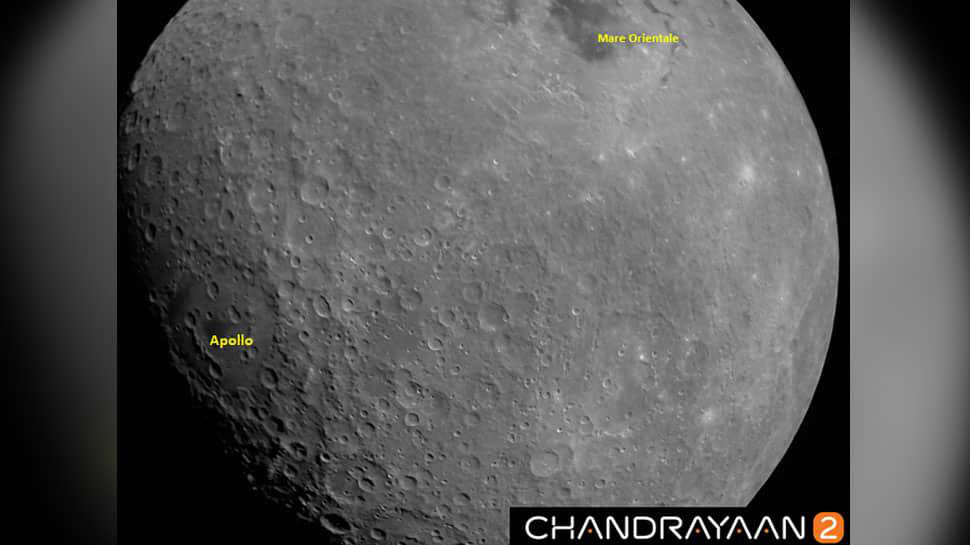

In [20]:
## Download image
download_image('https://english.cdn.zeenews.com/sites/default/files/2019/09/06/816813-chandrayaan-2.jpg', 'chandrayaan.jpg')
chandrayaan = Image.open('chandrayaan.jpg')
chandrayaan

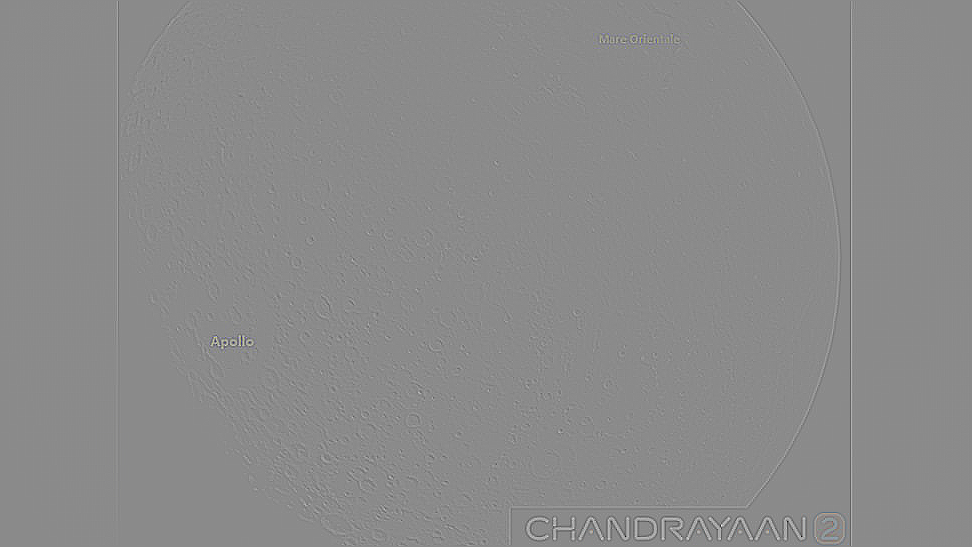

In [21]:
## Apply Laplacian filter and display
laplacian_op = apply_laplacian_filter(chandrayaan)
# Scale into [0, 255]
mx, mn = np.amax(laplacian_op), np.amin(laplacian_op)
filter_disp = (laplacian_op - mn)/(mx - mn) * 255
filter_disp = np.clip(filter_disp, 0, 255)
#Display Laplacian output
Image.fromarray(filter_disp.astype(np.uint8))

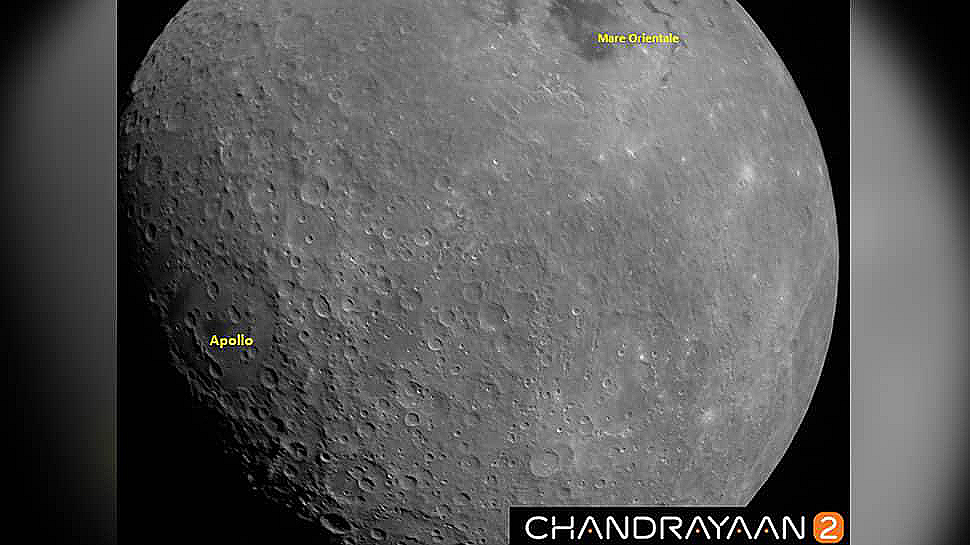

In [22]:
## Sharpen image by adding Laplacian output 
res = np.asarray(chandrayaan, dtype=float) + laplacian_op[1:-1,1:-1,:]
res = np.clip(res, 0, 255)
# Display sharpened image
Image.fromarray(res.astype(np.uint8))

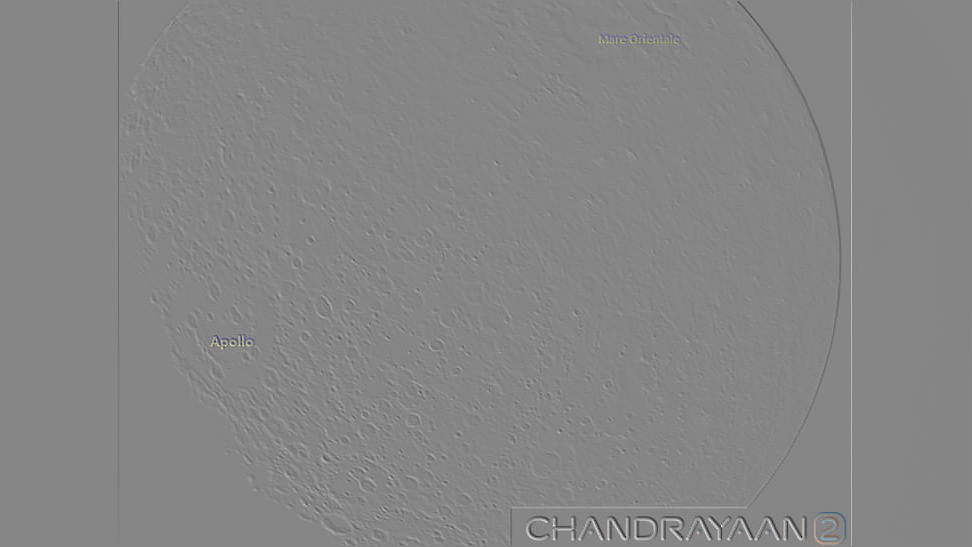

In [23]:
## Apply First Order Derivative Filter and display
first_order_derivative_op = apply_first_derivative_filter(chandrayaan)
# Scale into [0, 255]
mx, mn = np.amax(first_order_derivative_op), np.amin(first_order_derivative_op)
filter_disp = (first_order_derivative_op - mn)/(mx - mn) * 255
filter_disp = np.clip(filter_disp, 0, 255)
# Display Filter convolution output
Image.fromarray(filter_disp.astype(np.uint8))

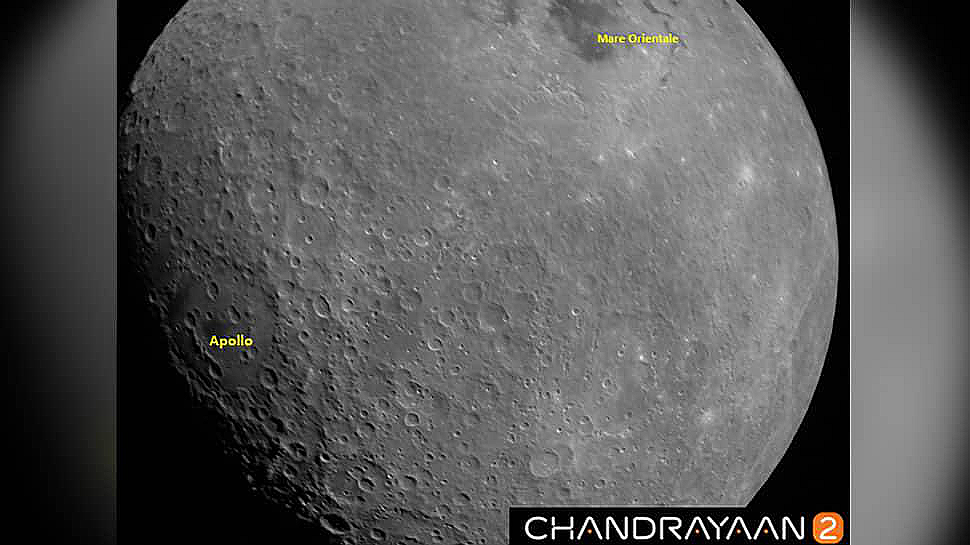

In [24]:
## Sharpen image by adding First Order Derivative output 
res = np.asarray(chandrayaan, dtype=float) + first_order_derivative_op[1:-1,1:-1,:]
res = np.clip(res, 0, 255)
# Display sharpened image
Image.fromarray(res.astype(np.uint8))

# Question 4: Discrete Wavelet Transform (DWT)
a) Perform DWT on this image using Haar and db 9/7 (individually)
b) Perform smoothing operation on each component
c) Perform Inverse DWT and obtain the smoothed image
d) On the original image, apply Gaussian smoothing filter (you can use an inbuilt function
here)
Report all the DWT coefficients for both DWT approaches. Draw your analysis of the results of
the two approaches.
Is there any difference between the outputs of (c) and (d)? Justify your answer. What is the
metric used to evaluate the difference between them? You are allowed to use inbuilt functions.
[10+10+10+5+20+5=60]

Image downloaded from url: https://www.math.ust.hk/~masyleung/Teaching/CAS/MATLAB/image/images/cameraman.jpg and saved to: cameraman.jpg.


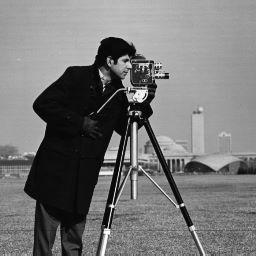

In [25]:
download_image('https://www.math.ust.hk/~masyleung/Teaching/CAS/MATLAB/image/images/cameraman.jpg', 'cameraman.jpg')
cameraman = Image.open('cameraman.jpg')
cameraman

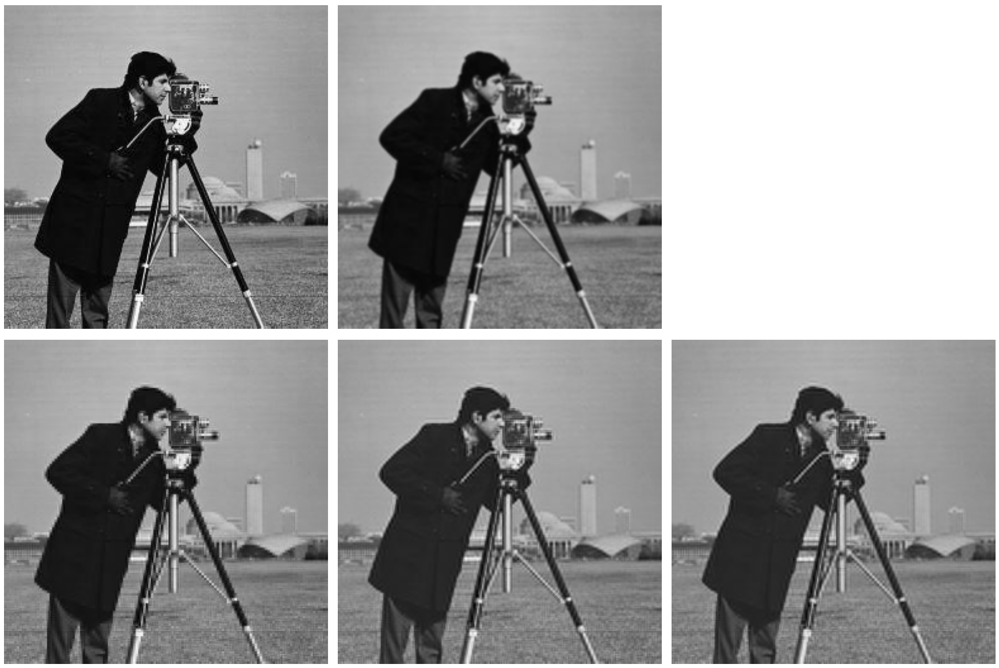

In [26]:
cameraman_np = np.array(cameraman)
fromDWT = []
fromFilter = cv.GaussianBlur(np.array(cameraman), (3,3), 0)
# Haar Filter
cA, (cH, cV, cD) = pywt.dwt2(cameraman, 'haar', axes=(0,1))
cH_blur, cV_blur, cD_blur = cv.GaussianBlur(cH, (3,3), 0), cv.GaussianBlur(cV, (3,3), 0), cv.GaussianBlur(cD, (3,3), 0)
fromDWT.append(np.zeros((cameraman_np.shape[0], cameraman_np.shape[1], 3)))
fromDWT[0] = cv.normalize(pywt.idwt2([cA, (cH_blur, cV_blur, cD_blur)], 'haar', axes=(0,1)), fromDWT[0], 0, 255, cv.NORM_MINMAX).astype(np.uint8)

# db7 Filter
cA, (cH, cV, cD) = pywt.dwt2(cameraman, 'db7', axes=(0,1))
cH_blur, cV_blur, cD_blur = cv.GaussianBlur(cH, (3,3), 0), cv.GaussianBlur(cV, (3,3), 0), cv.GaussianBlur(cD, (3,3), 0)
fromDWT.append(np.zeros((cameraman_np.shape[0], cameraman_np.shape[1], 3)))
fromDWT[1] = cv.normalize(pywt.idwt2([cA, (cH_blur, cV_blur, cD_blur)], 'db7', axes=(0,1)), fromDWT[1], 0, 255, cv.NORM_MINMAX).astype(np.uint8)

# db9 Filter
cA, (cH, cV, cD) = pywt.dwt2(cameraman, 'db9', axes=(0,1))
cH_blur, cV_blur, cD_blur = cv.GaussianBlur(cH, (3,3), 0), cv.GaussianBlur(cV, (3,3), 0), cv.GaussianBlur(cD, (3,3), 0)
fromDWT.append(np.zeros((cameraman_np.shape[0], cameraman_np.shape[1], 3)))
fromDWT[2] = cv.normalize(pywt.idwt2((cA, (cH_blur, cV_blur, cD_blur)), 'db9', axes=(0,1)), fromDWT[2], 0, 255, cv.NORM_MINMAX).astype(np.uint8)

fig, axs = plt.subplots(2,3, figsize=(24, 16), constrained_layout=True)
axs[0, 0].imshow(cameraman_np)
axs[0, 1].imshow(fromFilter)
for i in range(3):
  axs[1, i].imshow(fromDWT[i])
  axs[1,i].axis('off')
  axs[0,i].axis('off')


# Question 5: Image Watermarking techniques
For this image, perform the invisible watermarking using any technique. Use this image as a
watermark. You are allowed to use inbuilt functions.
Bonus: Students will get extra marks if done from scratch.

[20] + bonus=10

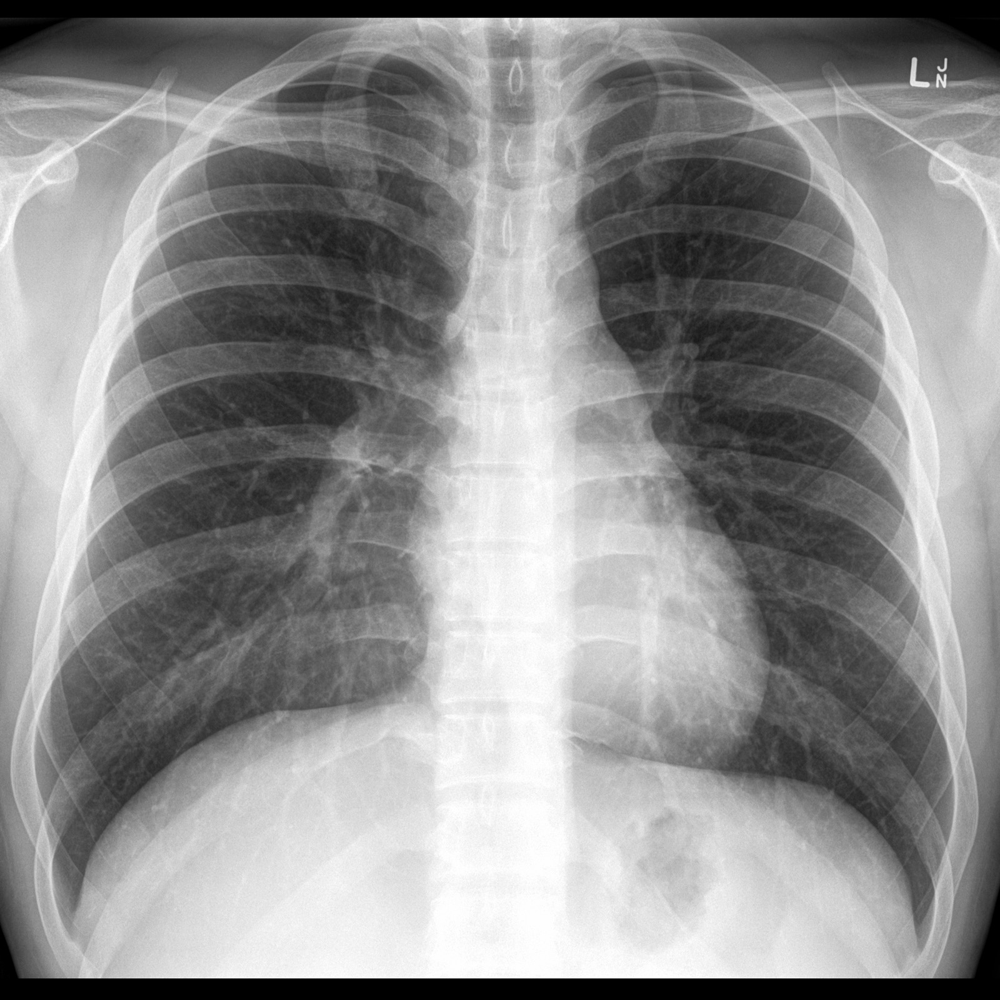

In [31]:
# Upload chest-xray image from Workplace/...CV
xray = np.array(Image.open('/content/normal-frontal-chest-x-ray.jpg'))
# download_image('https://upload.wikimedia.org/wikipedia/commons/2/25/Logo_IITJ.png', 'Logo_IITJ.png')
logo = np.array(Image.open('Logo_IITJ.png'))
def to_rgba(im):
    '''
    Convert grayscale to RGBA
    '''
    h, w = im.shape
    ret = np.empty((h, w, 4), dtype=np.uint8)
    ret[:, :, :] = im[:, :, np.newaxis]
    ret[:,:,3] = 255
    return ret
xray = to_rgba(xray)
Image.fromarray(xray)

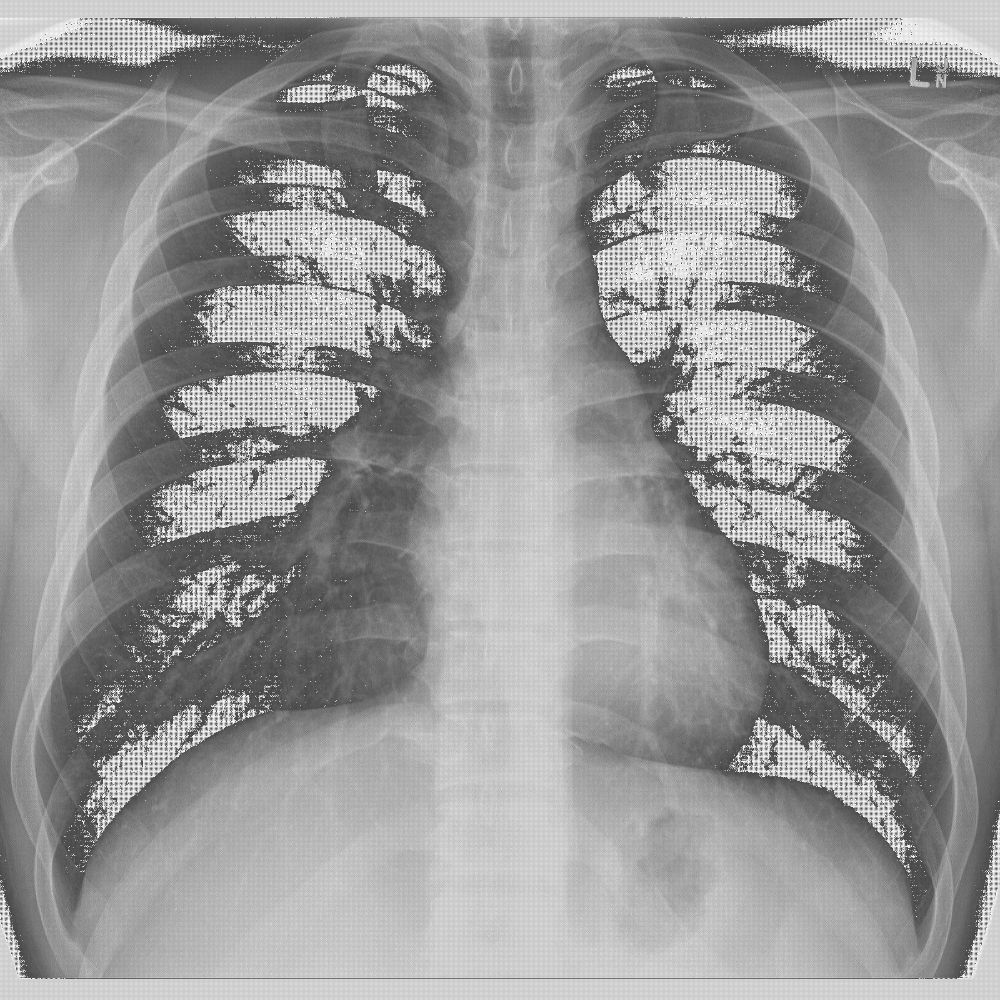

In [32]:
cA1, (cH1, cV1, cD1) = pywt.dwt2(xray, 'db2', axes=(0,1))
coeffs = pywt.wavedec2(logo, 'db2',  axes=(0,1))
norm_img = np.zeros_like(coeffs[0])
logoll = cv.normalize(coeffs[0],  norm_img, 0, 255, cv.NORM_MINMAX).astype(np.uint8)
_, res = cv.threshold(logoll,127,1,cv.THRESH_BINARY)
def preprocess_and_add_coeffs(img1, img2):
  '''
  img1 larger than img2
  '''
  h1, w1 = img1.shape[:2]
  h2, w2 = img2.shape[:2]
  # Pad img2 to make it of the shape of img1
  img2 = np.pad(img2, (((h1 - h2)//2, (h1 - h2)//2+1), ((w1 - w2)//2, (w1 - w2)//2+1), (0,0)))
  # add and normalize values
  norm_img = np.zeros_like(img1)
  return cv.normalize(img1 + img2,  norm_img, 0, 255, cv.NORM_MINMAX)

# cA = preprocess_and_add_coeffs(cA1, cA2)
cH = preprocess_and_add_coeffs(cH1, res)
cV = preprocess_and_add_coeffs(cV1, res)
cD = preprocess_and_add_coeffs(cD1, res)
# coeffs_list = [cA, coeffs1[1:][0]]

Image.fromarray(pywt.waverec2([cA1, (cH, cV, cD)], 'db2', axes=(0, 1)).astype(np.uint8))

#References
* https://gist.github.com/mjdietzx/545fa2874b2688e9bcb71e2ee92cd5a0
* https://www.geeksforgeeks.org/how-to-convert-images-to-numpy-array/
* https://code.tutsplus.com/tutorials/image-filtering-in-python--cms-29202
* https://sites.google.com/iitj.ac.in/cv2020/lecture-slides?authuser=0
* https://numpy.org/doc/stable/reference/index.html
* https://stackoverflow.com/questions/41500637/how-to-extract-r-g-b-values-with-numpy-into-seperate-arrays/41500767
* https://stackoverflow.com/questions/39619222/laplacian-sharpening-grey-image-as-result
* https://www.fil.ion.ucl.ac.uk/spm/doc/books/hbf1/Ch2.pdf
* https://stackabuse.com/affine-image-transformations-in-python-with-numpy-pillow-and-opencv/
* http://www.socouldanyone.com/2013/03/converting-grayscale-to-rgb-with-numpy.html